In [1]:
from igraph import *
import pickle
import folium
import folium.plugins
import shapely.geometry as sg
import pandas as pd
import numpy as np
from pyproj import Proj, Transformer
import pycrs
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset, TransformedBbox, BboxPatch, BboxConnector 

import seaborn as sns
sns.set_style('whitegrid')
sns.set_context('poster')
import ast

import warnings
warnings.filterwarnings('ignore')

In [2]:
items=['restaurant','bar','cafe','shop','supermarket','visual_enclosure_std','facade_complexity_std','park','green']


## Uploading data

In [3]:
with open('alpha_parameters_optimal.pk','rb') as file:
    opt=pickle.load(file)

In [4]:
with open('Human_path_30m_Nofilt_bos.pk','rb') as file:
    d=pickle.load(file,encoding='latin1')
    
with open('Human_path_30m_Nofilt_sf.pk','rb') as file:
    d_sf=pickle.load(file,encoding='latin1')

In [5]:
# sf

In [6]:
data=pd.read_csv('human_paths_filt_30m_ODt_bos.csv').dropna()
data['t0']=pd.to_datetime(data['t0'])
data['hour']=data['t0'].dt.hour
data['path']=data['pathID'].map(d)


sf_data=pd.read_csv('human_paths_filt_30m_ODt_sf.csv').dropna()
sf_data['t0']=pd.to_datetime(sf_data['t0'])
sf_data['hour']=sf_data['t0'].dt.hour
sf_data['path']=sf_data['pathID'].map(d_sf)

In [7]:
with open('boston_network_normal_park.pk','rb') as file:
    bos=pickle.load(file,encoding='latin1')
    
with open('sf_network_normal_park.pk','rb') as file:
    sf=pickle.load(file,encoding='latin1')


## Times

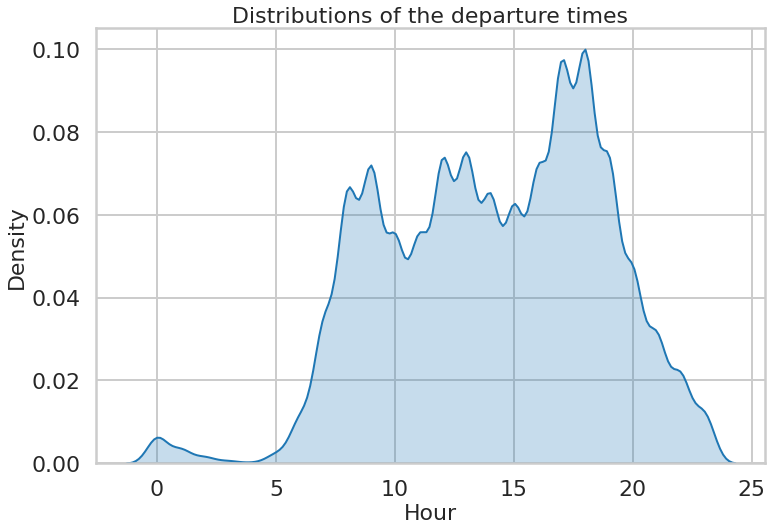

In [24]:
plt.figure(figsize=(12,8))
# plt.hist(data['hour'],bins=50,density=True,histtype='step')
sns.distplot(data['hour'],hist=False, kde_kws={'fill':'True'})
plt.title('Distributions of the departure times',fontsize=22)
plt.ylabel('Density',fontsize=22)
plt.xlabel('Hour',fontsize=22)
plt.show()

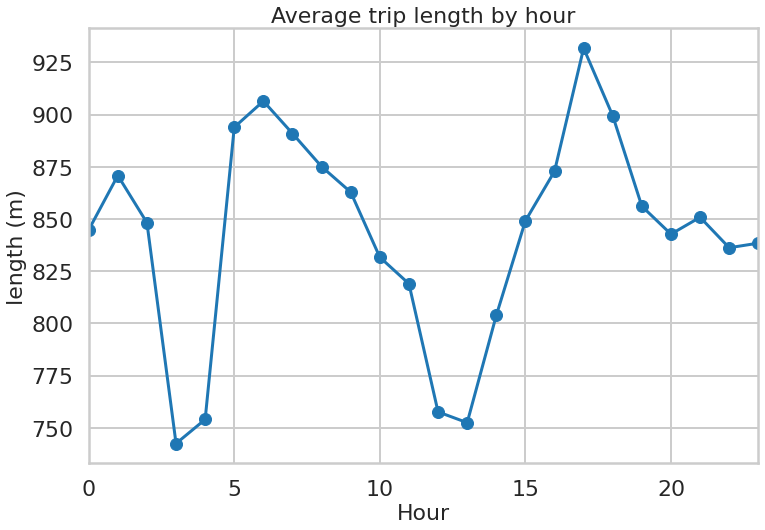

In [31]:
plt.figure(figsize=(12,8))
plt.plot(data.groupby('hour')['length'].mean(),'-o')
plt.title('Average trip length by hour',fontsize=22)
plt.ylabel('length (m)',fontsize=22)
plt.xlabel('Hour',fontsize=22)
plt.xlim(0,23)
plt.show()

## Real vs Short paths on a map

In [105]:
folium.Map( location=[39.7,-122.5], zoom_start=17 ).save("sfsf.html")

In [91]:
####### Define a function that draws the street mel segs


def draw_from_segs(vertex_list, graph, _map=None, color='blue',title=None,_cluster=None):
    coords=[]
    for i in range(len(vertex_list)):
        #seg=vertex_list[i:i+2]
        vertex=vertex_list[i]
        coords.append(graph.vs[vertex]['pos'])
    mapit = folium.Map( location=[coords[1][0], coords[1][1]], zoom_start=17 )
    
    

    
    if _map!=None:
        mapit=_map
    folium.vector_layers.PolyLine(coords,color=color).add_to(mapit)
    
    if _cluster==None:
        _cluster = folium.plugins.MarkerCluster().add_to(mapit)
    else:
        _cluster=_cluster
#     for c in coords:
#         folium.CircleMarker( location=[ c[0],c[1] ], radius=8, color=color,fill_color=color).add_to(_cluster)

    for c in coords:
        folium.CircleMarker( location=[ c[0],c[1] ], radius=8, color=color,fill_color=color).add_to(mapit)

        
    loc = 'Corpus Christi'
    if title!=None:     
        iframe = folium.IFrame(title, width=700, height=450)
        popup = folium.Popup(iframe, max_width=3000)
        
        Text = folium.Marker(location=[coords[1][0], coords[1][1]], popup=popup,
                             icon=folium.Icon(icon_color='green'))
        mapit.add_child(Text)
#     folium.Marker(coords[0]).add_to(mapit)
#     folium.Marker(coords[-1]).add_to(mapit)
    return mapit,_cluster

####### Define a function that draws the street mel coords

In [65]:
def ret_lens_shortest(path, graph):
    #print(path)
    shortest=graph.get_shortest_paths(v=path[0],to=path[-1],weights='weight')[0]
    len_short=graph.shortest_paths_dijkstra(source=path[0],target=path[-1],weights='weight')[0][0]
    if len(path)==2:
        len_real=graph.es.select(_source=path[0], _target=path[1])['weight'][0]
    else:
        len_real=sum([graph.es.select(_source=path[i], _target=path[i+1])['weight'][0] for i in range(len(path)-1)])
    return shortest,len_short, len_real

In [110]:
for att in bos.es.attributes():
    if att.startswith('b_osm'):
        del(bos.es[att])

In [1]:
# bos.es[bos.get_eid(2127,2128)]

In [123]:
l=data['path'].apply(lambda x:ret_lens_shortest(x,bos)).tolist()


In [ ]:
less_eq=[l.index(x) for x in l if x[1]<=x[2]]

In [ ]:
len(less_eq)/len(l)

In [53]:
l=data[(data['hour']==8) & (data['length']<500)].iloc[:100]['path'].apply(lambda x:ret_lens_shortest(x,bos)[0]).tolist()
lens=data[(data['hour']==8) & (data['length']<500)].iloc[:100]['path'].apply(lambda x:ret_lens_shortest(x,bos)[1:]).tolist()

In [2]:
# [lens.index(x) for x in lens if x[0]<x[1]]

In [97]:
k=24
_map,_cluster=draw_from_segs(data[(data['hour']==8) & (data['length']<500)].iloc[k]['path'],graph=bos,color='blue')
draw_from_segs(l[k],graph=bos,_map=_map,color='red',_cluster=_cluster)[0]


## Density maps

In [8]:
from geojson import Point, Feature, FeatureCollection, dump, LineString
import geopandas as gpd
import pandas as pd
from igraph import *
import pickle
import matplotlib.pyplot as plt
import matplotlib
from shapely.geometry import Point, Polygon
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import geoplot as gplt

In [16]:
# sf_data

In [203]:
x="bos"
h=23
dat=data[data['hour']==h]
sf_dat=sf_data[sf_data['hour']==h]

if x=="bos":
    g=bos
    paths=dat['path'].tolist()
    ymin, xmin, ymax, xmax= 42.337571412658804, -71.11627562093652, 42.378080760486235, -71.03925204569101 #Boston
    ymin_big, xmin_big, ymax_big, xmax_big=42.25,-71.20,42.45,-71#Boston

    
elif x=="sf":  
    g=sf
    paths=sf_dat['path'].tolist()
    ymin, xmin, ymax, xmax= 37.70,-122.52,37.83,-122.37 #SF
    ymin_big, xmin_big, ymax_big, xmax_big=37.52,-122.52,37.92,-122.27#SF



In [204]:
from collections import Counter

edges=[i for i in range(len(g.es()))]
paths=[[(x[i],x[i+1]) for i in range(len(x)-1)] for x in paths]
paths=[j for i in paths for j in i]
paths=[g.get_eid(x[0], x[1]) for x in paths]
c = Counter(paths)
c={k: v for k, v in sorted(c.items(), key=lambda item: item[1],reverse=True)}

not_crossed=list(set(edges)-set(paths))
for e in not_crossed:
    c[e]=0



In [205]:
# origin

In [206]:
seg_id=list(c.keys())

coords=[(g.vs[g.es[i].source]['pos'],g.vs[g.es[i].target]['pos']) for i in seg_id]
origin=[g.es[i].source for i in seg_id]
dest=[g.es[i].target for i in seg_id]
count=[c[k] for k in seg_id]

features = []
for i in range(len(seg_id)):
    features.append(Feature(geometry=LineString((coords[i][0][::-1],coords[i][1][::-1])), properties={"segment_id": seg_id[i],"source_node":origin[i],"target_node":dest[i],"count":count[i]}))

feature_collection = FeatureCollection(features)

df=gpd.GeoDataFrame.from_features(feature_collection)

In [207]:
# for att in ['bar','restaurant','cafe','shop','supermarket','park','green','amenity','sidewalk_std','urban_furniture_std','heavy_street','light_street','moderate_street','visual_enclosure_std','facade_complexity_std']:
#     att_dict=dict(zip([i for i in range(len(g.es()))],g.es[att]))
#     df[att]=df['segment_id'].map(att_dict)
# df['park_green']=df['park']+df['green']
# df['business']=df['bar']+df['cafe']+df['restaurant']+df['shop']+df['supermarket']

In [208]:
# df

In [209]:
# ymin, xmin, ymax, xmax = 42.34634692080796, -71.08705623398335, 42.37106753570958, -71.04835249926651

# if x=="bos":
#     ymin, xmin, ymax, xmax= 42.337571412658804, -71.11627562093652, 42.378080760486235, -71.03925204569101 #Boston
#     ymin_big, xmin_big, ymax_big, xmax_big=42.25,-71.20,42.45,-71#Boston

    
# elif x=="sf":    
#     ymin, xmin, ymax, xmax= 37.72,-122.52,37.83,-122.37 #SF
#     ymin_big, xmin_big, ymax_big, xmax_big=37.52,-122.52,37.92,-122.27#SF


In [210]:
# df['count'].describe(percentiles=[0,0.25,0.5,0.75,0.8,0.995])

In [211]:
# plt.hist(np.log1p(df['count'])**2,bins=20)
# plt.hist(df['count'],bins=20)

In [212]:
df.bounds.min()

minx   -71.291240
miny    42.189830
maxx   -71.291175
maxy    42.189919
dtype: float64

In [213]:
# df_lim['count'].max()

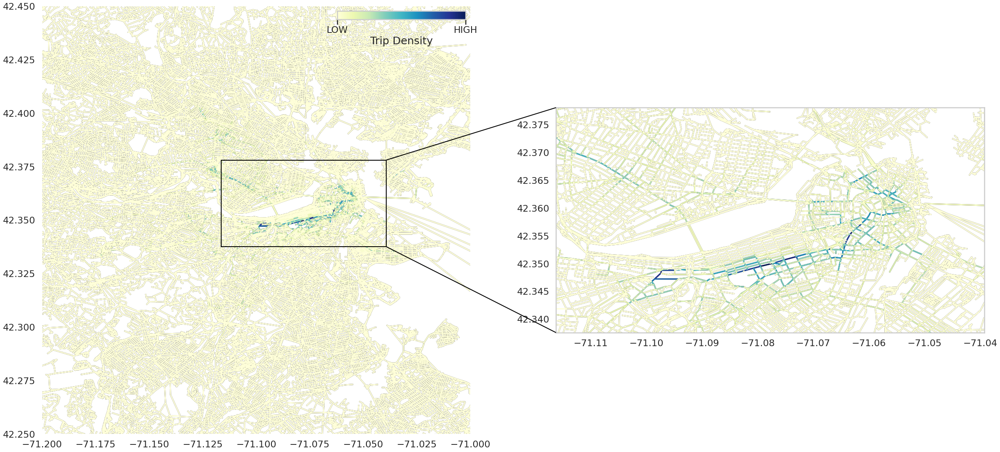

In [214]:
fig,(ax,ax2)=plt.subplots(figsize=(40,20),ncols=2)
ax.grid(False)




df_lim=df.cx[xmin_big:xmax_big, ymin_big:ymax_big]


df_lim['count']=np.log1p(df_lim['count'])**2
variable='count'

axins = inset_axes(ax,
                    width="30%",  # width = 50% of parent_bbox width
                    height="2%",  # height : 5%
                    loc='upper right')




# ax.xaxis(False)
cmap0 = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#000000","#000000"])
cmap = 'YlGnBu'
cmap = 'YlOrBr'
cmap='YlGnBu'

df_lim.plot(ax=ax,cmap=cmap0)
df_lim.plot(column=variable,ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})

ax.set_xlim(xmin=xmin_big, xmax=xmax_big)
ax.set_ylim(ymin=ymin_big, ymax=ymax_big)

# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

norm = matplotlib.colors.Normalize(vmin=df_lim['count'].min(), vmax=df_lim['count'].max())
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[0,df_lim['count'].max()],cax=axins)
# add label for the colorbar
ax_cbar.set_label('Trip Density',size=25)
ax_cbar.set_ticks([0,df_lim['count'].max()])
ax_cbar.set_ticklabels(['LOW','HIGH'])



# plt.show()

# vmin, vmax, vcenter = df_lim.Density_sqkms.min(), df_lim.Density_sqkms.max(), df_lim.Density_sqkms.mean()
# divnorm = matplotlib.colors.TwoSlopeNorm (vmin=vmin, vcenter=vcenter, vmax=vmax)
# cbar = plt.cm.ScalarMappable(norm=divnorm, cmap=cmap)
# fig.colorbar(cbar, ax=ax)

# fig, ax = plt.subplots(figsize=[5,4])

# axins = zoomed_inset_axes(ax, 3, loc=1)
# df_lim.plot(ax=axins,cmap=cmap0)
# df_lim.plot(column=variable,ax=axins,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})


# # sub region of the original image
# axins.set_xlim(xmax=xmax,xmin=xmin)
# axins.set_ylim(ymax=ymax,ymin=ymin)

# plt.xticks(visible=False)
# plt.yticks(visible=False)


df_lim.plot(ax=ax2,cmap=cmap0)
df_lim.plot(column=variable,ax=ax2,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
ax2.set_xlim(xmax=xmax,xmin=xmin)
ax2.set_ylim(ymax=ymax,ymin=ymin)
ax2.grid(False)
# draw a bbox of the region of the inset axes in the parent axes and
# connecting lines between the bbox and the inset axes area

def mark_inset(parent_axes, inset_axes, loc1a=1, loc1b=1, loc2a=2, loc2b=2, **kwargs):
    rect = TransformedBbox(inset_axes.viewLim, parent_axes.transData)

    pp = BboxPatch(rect, fill=False, **kwargs)
    parent_axes.add_patch(pp)

    p1 = BboxConnector(inset_axes.bbox, rect, loc1=loc1a, loc2=loc1b, **kwargs)
    inset_axes.add_patch(p1)
    p1.set_clip_on(False)
    p2 = BboxConnector(inset_axes.bbox, rect, loc1=loc2a, loc2=loc2b, **kwargs)
    inset_axes.add_patch(p2)
    p2.set_clip_on(False)

    return pp, p1, p2

mark_inset(ax, ax2, loc1a=2, loc1b=1, loc2a=3, loc2b=4, fc="none", ec="black", lw="2", ls="-",zorder=3) 


# fig.tight_layout(pad=2)
# plt.draw()
plt.show()
fig.savefig('pictures/'+x+str(h)+'.png')
# fig.savefig('pictures/'+'trip_density'+'_'+x+'.png')

In [130]:
# df['park_green'].describe(percentiles=[0,.85,.9,.9999])

## Parks and rec

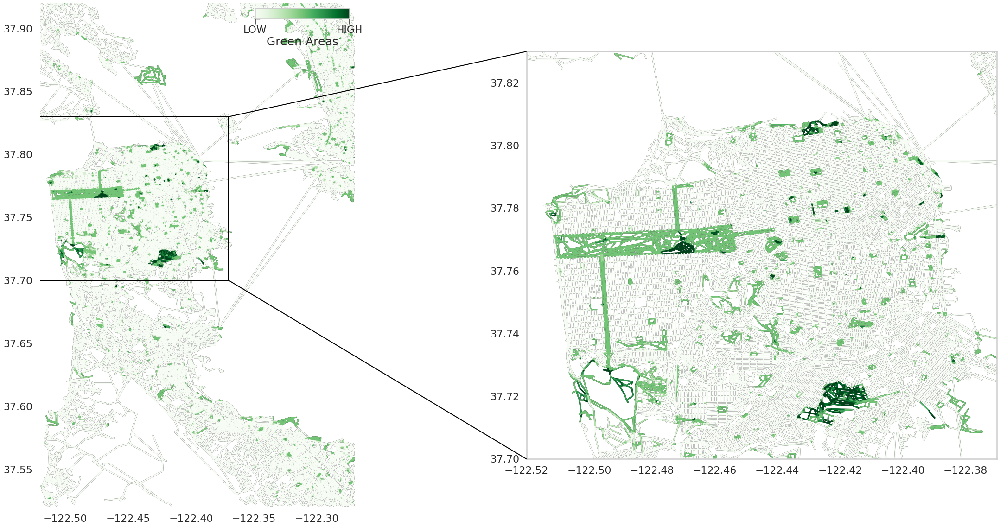

In [361]:
fig,(ax,ax2)=plt.subplots(figsize=(40,20),ncols=2)
ax.grid(False)

df_lim=df.cx[xmin_big:xmax_big, ymin_big:ymax_big]



variable='park_green'
# df_lim[variable]=np.exp(df_lim[variable])

axins = inset_axes(ax,
                    width="30%",  # width = 50% of parent_bbox width
                    height="2%",  # height : 5%
                    loc='upper right')



# # ax.xaxis(False)
# cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#DCDCDC","red"])
# cmap = 'Greens'
# df_lim.plot(ax=ax,cmap='gray')
# df_lim.plot(column='park_green',ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# ax.spines['left'].set_visible(False)

# norm = matplotlib.colors.Normalize(vmin=df_lim.park_green.min(), vmax=df_lim.park_green.max())
# cbar = plt.cm.ScalarMappable(norm=norm, cmap='Greens')
# ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[0,2],cax=axins)
# # add label for the colorbar
# ax_cbar.set_label('Overlap with parks and green areas',size=20)
# ax_cbar.ax.set_xticklabels(['LOW','HIGH'])

# ax.xaxis(False)
cmap0 = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#000000","#000000"])
cmap = 'YlGnBu'
cmap = 'YlOrBr'
cmap='Greens'

df_lim.plot(ax=ax,cmap=cmap0)
df_lim.plot(column=variable,ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})

ax.set_xlim(xmin=xmin_big, xmax=xmax_big)
ax.set_ylim(ymin=ymin_big, ymax=ymax_big)

# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

norm = matplotlib.colors.Normalize(vmin=df_lim[variable].min(), vmax=df_lim[variable].max())
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[0,df_lim[variable].max()],cax=axins)
# add label for the colorbar
ax_cbar.set_label('Green Areas',size=25)
ax_cbar.set_ticks([0,df_lim[variable].max()])
ax_cbar.set_ticklabels(['LOW','HIGH'])







df_lim.plot(ax=ax2,cmap=cmap0)
df_lim.plot(column=variable,ax=ax2,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
ax2.set_xlim(xmax=xmax,xmin=xmin)
ax2.set_ylim(ymax=ymax,ymin=ymin)
ax2.grid(False)
# draw a bbox of the region of the inset axes in the parent axes and
# connecting lines between the bbox and the inset axes area

def mark_inset(parent_axes, inset_axes, loc1a=1, loc1b=1, loc2a=2, loc2b=2, **kwargs):
    rect = TransformedBbox(inset_axes.viewLim, parent_axes.transData)

    pp = BboxPatch(rect, fill=False, **kwargs)
    parent_axes.add_patch(pp)

    p1 = BboxConnector(inset_axes.bbox, rect, loc1=loc1a, loc2=loc1b, **kwargs)
    inset_axes.add_patch(p1)
    p1.set_clip_on(False)
    p2 = BboxConnector(inset_axes.bbox, rect, loc1=loc2a, loc2=loc2b, **kwargs)
    inset_axes.add_patch(p2)
    p2.set_clip_on(False)

    return pp, p1, p2

mark_inset(ax, ax2, loc1a=2, loc1b=1, loc2a=3, loc2b=4, fc="none", ec="black", lw="2", ls="-",zorder=3) 






plt.show()
fig.savefig('pictures/'+variable+'_'+x+'.png')
# vmin, vmax, vcenter = df_lim.Density_sqkms.min(), df_lim.Density_sqkms.max(), df_lim.Density_sqkms.mean()
# divnorm = matplotlib.colors.TwoSlopeNorm (vmin=vmin, vcenter=vcenter, vmax=vmax)
# cbar = plt.cm.ScalarMappable(norm=divnorm, cmap=cmap)
# fig.colorbar(cbar, ax=ax)


## Amenities

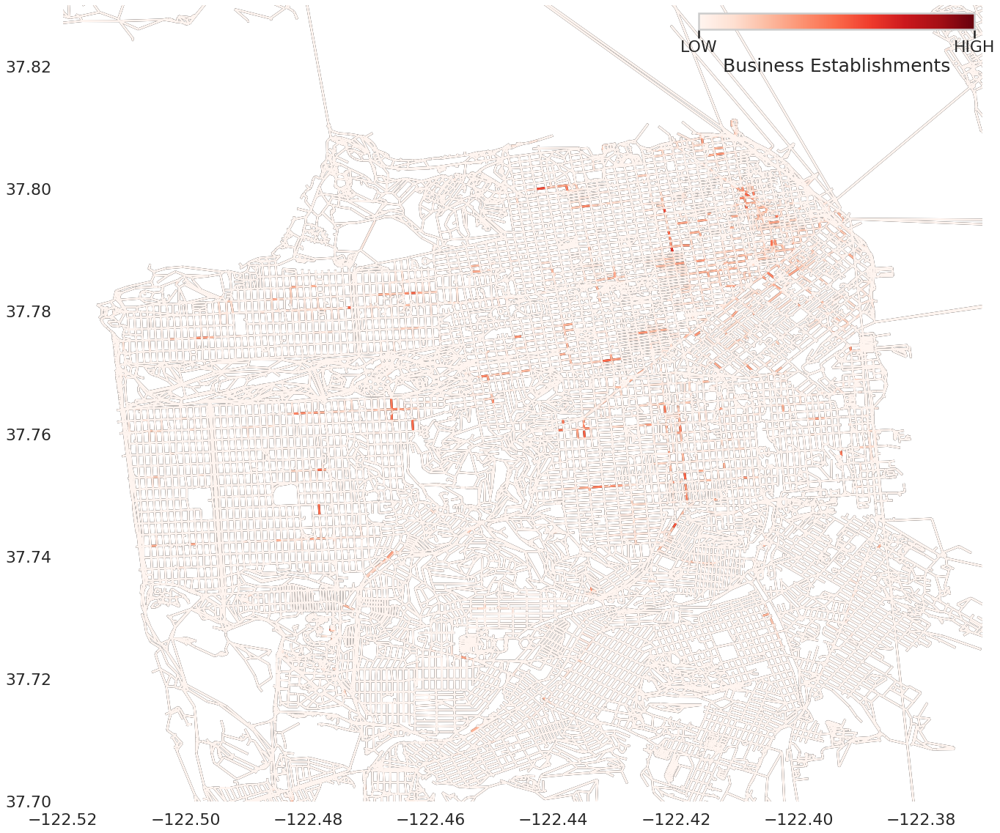

In [362]:
fig,ax=plt.subplots(figsize=(40,20))
ax.grid(False)

df_lim=df.cx[xmin_big:xmax_big, ymin_big:ymax_big]



variable='business'
df_lim[variable]=np.log1p(df_lim[variable])

axins = inset_axes(ax,
                    width="30%",  # width = 50% of parent_bbox width
                    height="2%",  # height : 5%
                    loc='upper right')



# # ax.xaxis(False)
# cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#DCDCDC","red"])
# cmap = 'Greens'
# df_lim.plot(ax=ax,cmap='gray')
# df_lim.plot(column='park_green',ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# ax.spines['left'].set_visible(False)

# norm = matplotlib.colors.Normalize(vmin=df_lim.park_green.min(), vmax=df_lim.park_green.max())
# cbar = plt.cm.ScalarMappable(norm=norm, cmap='Greens')
# ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[0,2],cax=axins)
# # add label for the colorbar
# ax_cbar.set_label('Overlap with parks and green areas',size=20)
# ax_cbar.ax.set_xticklabels(['LOW','HIGH'])

# ax.xaxis(False)
cmap0 = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#000000","#000000"])
cmap = 'YlGnBu'
cmap = 'YlOrBr'
cmap='Reds'

df_lim.plot(ax=ax,cmap=cmap0)
df_lim.plot(column=variable,ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})

ax.set_xlim(xmin=xmin, xmax=xmax)
ax.set_ylim(ymin=ymin, ymax=ymax)

# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

norm = matplotlib.colors.Normalize(vmin=df_lim[variable].min(), vmax=df_lim[variable].max())
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[0,df_lim[variable].max()],cax=axins)
# add label for the colorbar
ax_cbar.set_label('Business Establishments',size=25)
ax_cbar.set_ticks([0,df_lim[variable].max()])
ax_cbar.set_ticklabels(['LOW','HIGH'])







# df_lim.plot(ax=ax2,cmap=cmap0)
# df_lim.plot(column=variable,ax=ax2,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
# ax2.set_xlim(xmax=xmax,xmin=xmin)
# ax2.set_ylim(ymax=ymax,ymin=ymin)
# ax2.grid(False)
# # draw a bbox of the region of the inset axes in the parent axes and
# # connecting lines between the bbox and the inset axes area

# def mark_inset(parent_axes, inset_axes, loc1a=1, loc1b=1, loc2a=2, loc2b=2, **kwargs):
#     rect = TransformedBbox(inset_axes.viewLim, parent_axes.transData)

#     pp = BboxPatch(rect, fill=False, **kwargs)
#     parent_axes.add_patch(pp)

#     p1 = BboxConnector(inset_axes.bbox, rect, loc1=loc1a, loc2=loc1b, **kwargs)
#     inset_axes.add_patch(p1)
#     p1.set_clip_on(False)
#     p2 = BboxConnector(inset_axes.bbox, rect, loc1=loc2a, loc2=loc2b, **kwargs)
#     inset_axes.add_patch(p2)
#     p2.set_clip_on(False)

#     return pp, p1, p2

# mark_inset(ax, ax2, loc1a=2, loc1b=1, loc2a=3, loc2b=4, fc="none", ec="black", lw="2", ls="-",zorder=3) 






plt.show()
fig.savefig('pictures/'+variable+'_'+x+'.png')

# vmin, vmax, vcenter = df_lim.Density_sqkms.min(), df_lim.Density_sqkms.max(), df_lim.Density_sqkms.mean()
# divnorm = matplotlib.colors.TwoSlopeNorm (vmin=vmin, vcenter=vcenter, vmax=vmax)
# cbar = plt.cm.ScalarMappable(norm=divnorm, cmap=cmap)
# fig.colorbar(cbar, ax=ax)


## Computer Vision

In [313]:
# df['facade_complexity_std'].min()

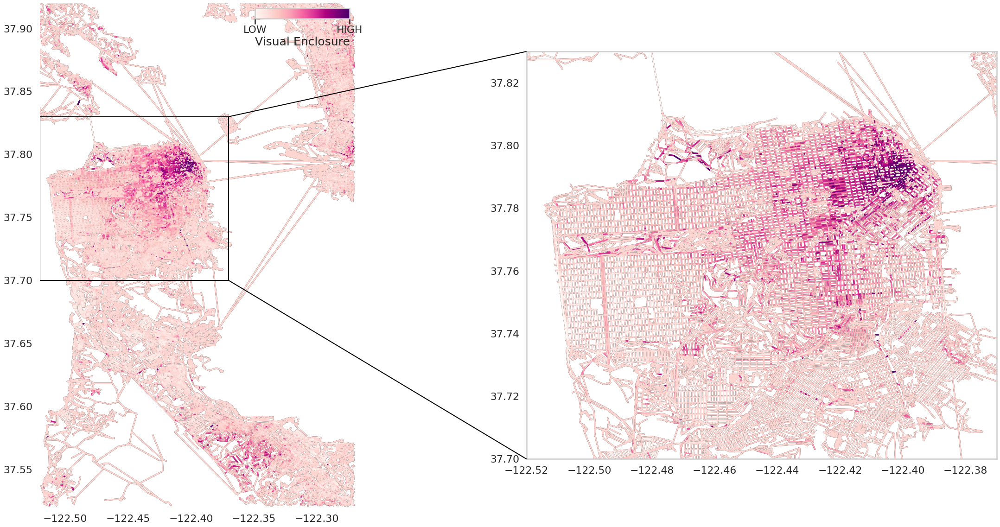

In [363]:
fig,(ax,ax2)=plt.subplots(figsize=(40,20),ncols=2)
ax.grid(False)

df_lim=df.cx[xmin_big:xmax_big, ymin_big:ymax_big]



variable='visual_enclosure_std'
df_lim[variable]=-(df_lim[variable]+1) #visual enclosure
mm=df_lim[variable].min()
# df_lim[variable]=df_lim[variable]+mm
df_lim[variable]=np.exp(df_lim[variable])

axins = inset_axes(ax,
                    width="30%",  # width = 50% of parent_bbox width
                    height="2%",  # height : 5%
                    loc='upper right')



# # ax.xaxis(False)
# cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#DCDCDC","red"])
# cmap = 'Greens'
# df_lim.plot(ax=ax,cmap='gray')
# df_lim.plot(column='park_green',ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# ax.spines['left'].set_visible(False)

# norm = matplotlib.colors.Normalize(vmin=df_lim.park_green.min(), vmax=df_lim.park_green.max())
# cbar = plt.cm.ScalarMappable(norm=norm, cmap='Greens')
# ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[0,2],cax=axins)
# # add label for the colorbar
# ax_cbar.set_label('Overlap with parks and green areas',size=20)
# ax_cbar.ax.set_xticklabels(['LOW','HIGH'])

# ax.xaxis(False)
cmap0 = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#000000","#000000"])
cmap = 'YlGnBu'
cmap = 'YlOrBr'
cmap='RdPu' #ve

df_lim.plot(ax=ax,cmap=cmap0)
df_lim.plot(column=variable,ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})

ax.set_xlim(xmin=xmin_big, xmax=xmax_big)
ax.set_ylim(ymin=ymin_big, ymax=ymax_big)

# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

norm = matplotlib.colors.Normalize(vmin=df_lim[variable].min(), vmax=df_lim[variable].max())
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[df_lim[variable].min(),df_lim[variable].max()],cax=axins)
# add label for the colorbar
ax_cbar.set_label(' '.join(variable.split('_')[:-1]).title(),size=25)
ax_cbar.set_ticks([df_lim[variable].min(),df_lim[variable].max()])
ax_cbar.set_ticklabels(['LOW','HIGH'])







df_lim.plot(ax=ax2,cmap=cmap0)
df_lim.plot(column=variable,ax=ax2,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
ax2.set_xlim(xmax=xmax,xmin=xmin)
ax2.set_ylim(ymax=ymax,ymin=ymin)
ax2.grid(False)
# draw a bbox of the region of the inset axes in the parent axes and
# connecting lines between the bbox and the inset axes area

def mark_inset(parent_axes, inset_axes, loc1a=1, loc1b=1, loc2a=2, loc2b=2, **kwargs):
    rect = TransformedBbox(inset_axes.viewLim, parent_axes.transData)

    pp = BboxPatch(rect, fill=False, **kwargs)
    parent_axes.add_patch(pp)

    p1 = BboxConnector(inset_axes.bbox, rect, loc1=loc1a, loc2=loc1b, **kwargs)
    inset_axes.add_patch(p1)
    p1.set_clip_on(False)
    p2 = BboxConnector(inset_axes.bbox, rect, loc1=loc2a, loc2=loc2b, **kwargs)
    inset_axes.add_patch(p2)
    p2.set_clip_on(False)

    return pp, p1, p2

mark_inset(ax, ax2, loc1a=2, loc1b=1, loc2a=3, loc2b=4, fc="none", ec="black", lw="2", ls="-",zorder=3) 






plt.show()
fig.savefig('pictures/'+variable+'_'+x+'.png')

# vmin, vmax, vcenter = df_lim.Density_sqkms.min(), df_lim.Density_sqkms.max(), df_lim.Density_sqkms.mean()
# divnorm = matplotlib.colors.TwoSlopeNorm (vmin=vmin, vcenter=vcenter, vmax=vmax)
# cbar = plt.cm.ScalarMappable(norm=divnorm, cmap=cmap)
# fig.colorbar(cbar, ax=ax)


In [3]:
# df_lim['sidewalk_std'].describe()

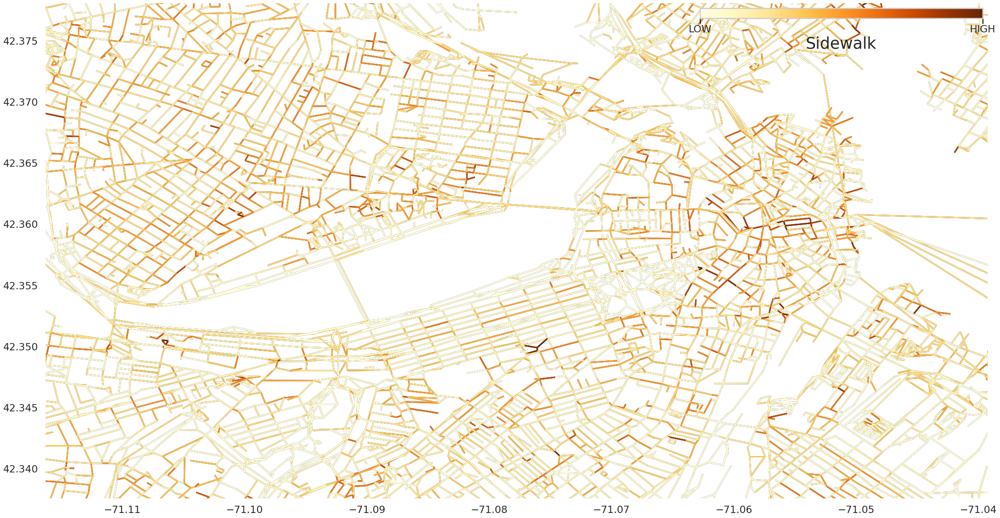

In [421]:
fig,ax=plt.subplots(figsize=(40,20))
ax.grid(False)

df_lim=df.cx[xmin_big:xmax_big, ymin_big:ymax_big]



variable='sidewalk_std'
# df_lim[variable]=-(df_lim[variable]+1) #visual enclosure
mm=df_lim[variable].min()
df_lim[variable]=df_lim[variable]+abs(mm)
# df_lim[variable]=np.log1p(df_lim[variable])

axins = inset_axes(ax,
                    width="30%",  # width = 50% of parent_bbox width
                    height="2%",  # height : 5%
                    loc='upper right')



# # ax.xaxis(False)
# cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#DCDCDC","red"])
# cmap = 'Greens'
# df_lim.plot(ax=ax,cmap='gray')
# df_lim.plot(column='park_green',ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# ax.spines['left'].set_visible(False)

# norm = matplotlib.colors.Normalize(vmin=df_lim.park_green.min(), vmax=df_lim.park_green.max())
# cbar = plt.cm.ScalarMappable(norm=norm, cmap='Greens')
# ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[0,2],cax=axins)
# # add label for the colorbar
# ax_cbar.set_label('Overlap with parks and green areas',size=20)
# ax_cbar.ax.set_xticklabels(['LOW','HIGH'])

# ax.xaxis(False)
cmap0 = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#000000","#000000"])
cmap = 'YlGnBu'
cmap = 'YlOrBr'
cmap='PuBuGn' #fc
cmap='Oranges' #uf
cmap='YlOrBr' #sidewalk


df_lim.plot(ax=ax,cmap=cmap0)
df_lim.plot(column=variable,ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})

ax.set_xlim(xmin=xmin, xmax=xmax)
ax.set_ylim(ymin=ymin, ymax=ymax)

# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

norm = matplotlib.colors.Normalize(vmin=df_lim[variable].min(), vmax=df_lim[variable].max())
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[df_lim[variable].min(),df_lim[variable].max()],cax=axins)
# add label for the colorbar
ax_cbar.set_label(' '.join(variable.split('_')[:-1]).title(),size=35)
ax_cbar.set_ticks([df_lim[variable].min(),df_lim[variable].max()])
ax_cbar.set_ticklabels(['LOW','HIGH'])



plt.show()
fig.savefig('pictures/'+variable+'_'+x+'.png')

# vmin, vmax, vcenter = df_lim.Density_sqkms.min(), df_lim.Density_sqkms.max(), df_lim.Density_sqkms.mean()
# divnorm = matplotlib.colors.TwoSlopeNorm (vmin=vmin, vcenter=vcenter, vmax=vmax)
# cbar = plt.cm.ScalarMappable(norm=divnorm, cmap=cmap)
# fig.colorbar(cbar, ax=ax)


## Street affluence

In [404]:
df['affluence']=df['light_street']+2*df['moderate_street']+3*df['heavy_street']

In [4]:
# import matplotlib

# cmap = matplotlib.cm.get_cmap('Paired')
# for i in range(cmap.N):
#     rgba = cmap(i)
#     # rgb2hex accepts rgb or rgba
#     print(matplotlib.colors.rgb2hex(rgba))

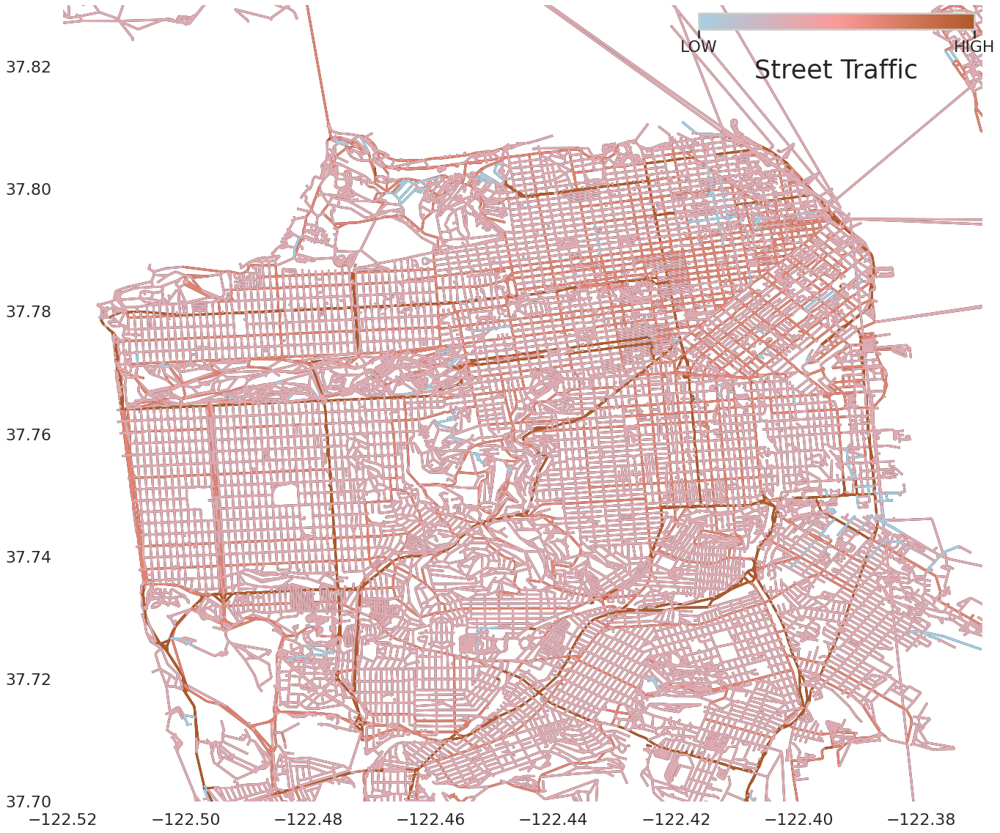

In [407]:
fig,ax=plt.subplots(figsize=(40,20))
ax.grid(False)

df_lim=df.cx[xmin_big:xmax_big, ymin_big:ymax_big]



variable='affluence'
# df_lim[variable]=-(df_lim[variable]+1) #visual enclosure
# mm=df_lim[variable].min()
# df_lim[variable]=df_lim[variable]+mm
# df_lim[variable]=np.log1p(df_lim[variable])

axins = inset_axes(ax,
                    width="30%",  # width = 50% of parent_bbox width
                    height="2%",  # height : 5%
                    loc='upper right')



# # ax.xaxis(False)
# cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#DCDCDC","red"])
# cmap = 'Greens'
# df_lim.plot(ax=ax,cmap='gray')
# df_lim.plot(column='park_green',ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# ax.spines['left'].set_visible(False)

# norm = matplotlib.colors.Normalize(vmin=df_lim.park_green.min(), vmax=df_lim.park_green.max())
# cbar = plt.cm.ScalarMappable(norm=norm, cmap='Greens')
# ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[0,2],cax=axins)
# # add label for the colorbar
# ax_cbar.set_label('Overlap with parks and green areas',size=20)
# ax_cbar.ax.set_xticklabels(['LOW','HIGH'])

# ax.xaxis(False)
cmap0 = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#000000","#000000"])
cmap = 'Paired'
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["#a6cee3","#fb9a99","#b15928"])



df_lim.plot(ax=ax,cmap=cmap0)
df_lim.plot(column=variable,ax=ax,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})

ax.set_xlim(xmin=xmin, xmax=xmax)
ax.set_ylim(ymin=ymin, ymax=ymax)

# ax.set_xlim(xmax=xmax,xmin=xmin)
# ax.set_ylim(ymax=ymax,ymin=ymin)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

norm = matplotlib.colors.Normalize(vmin=df_lim[variable].min(), vmax=df_lim[variable].max())
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
ax_cbar = fig.colorbar(cbar, ax=ax, orientation='horizontal',fraction=0.01, pad=0.01, ticks=[df_lim[variable].min(),df_lim[variable].max()],cax=axins)
# add label for the colorbar
ax_cbar.set_label('Street Traffic',size=35)
ax_cbar.set_ticks([df_lim[variable].min(),df_lim[variable].max()])
ax_cbar.set_ticklabels(['LOW','HIGH'])







# df_lim.plot(ax=ax2,cmap=cmap0)
# df_lim.plot(column=variable,ax=ax2,cmap=cmap,legend=False)#,legend_kwds={'label': "parks and green areas",'orientation': "horizontal", "fraction":0.02, "pad":0.04})
# ax2.set_xlim(xmax=xmax,xmin=xmin)
# ax2.set_ylim(ymax=ymax,ymin=ymin)
# ax2.grid(False)
# # draw a bbox of the region of the inset axes in the parent axes and
# # connecting lines between the bbox and the inset axes area

# def mark_inset(parent_axes, inset_axes, loc1a=1, loc1b=1, loc2a=2, loc2b=2, **kwargs):
#     rect = TransformedBbox(inset_axes.viewLim, parent_axes.transData)

#     pp = BboxPatch(rect, fill=False, **kwargs)
#     parent_axes.add_patch(pp)

#     p1 = BboxConnector(inset_axes.bbox, rect, loc1=loc1a, loc2=loc1b, **kwargs)
#     inset_axes.add_patch(p1)
#     p1.set_clip_on(False)
#     p2 = BboxConnector(inset_axes.bbox, rect, loc1=loc2a, loc2=loc2b, **kwargs)
#     inset_axes.add_patch(p2)
#     p2.set_clip_on(False)

#     return pp, p1, p2

# mark_inset(ax, ax2, loc1a=2, loc1b=1, loc2a=3, loc2b=4, fc="none", ec="black", lw="2", ls="-",zorder=3) 






plt.show()
fig.savefig('pictures/'+variable+'_'+x+'.png')

# vmin, vmax, vcenter = df_lim.Density_sqkms.min(), df_lim.Density_sqkms.max(), df_lim.Density_sqkms.mean()
# divnorm = matplotlib.colors.TwoSlopeNorm (vmin=vmin, vcenter=vcenter, vmax=vmax)
# cbar = plt.cm.ScalarMappable(norm=divnorm, cmap=cmap)
# fig.colorbar(cbar, ax=ax)
